# **WORLDWIDE COVID19 DATA ANALYSIS**

This project is basesd on the data anlaysis on covid19 patients of differnt countries across the world .The dataset contains the record of all the  Recoverd,Active,Confirmed covid cases across different countries and region.

The dataset has been downloaded from kaggle here is the [link](https://www.kaggle.com/imdevskp/corona-virus-report)

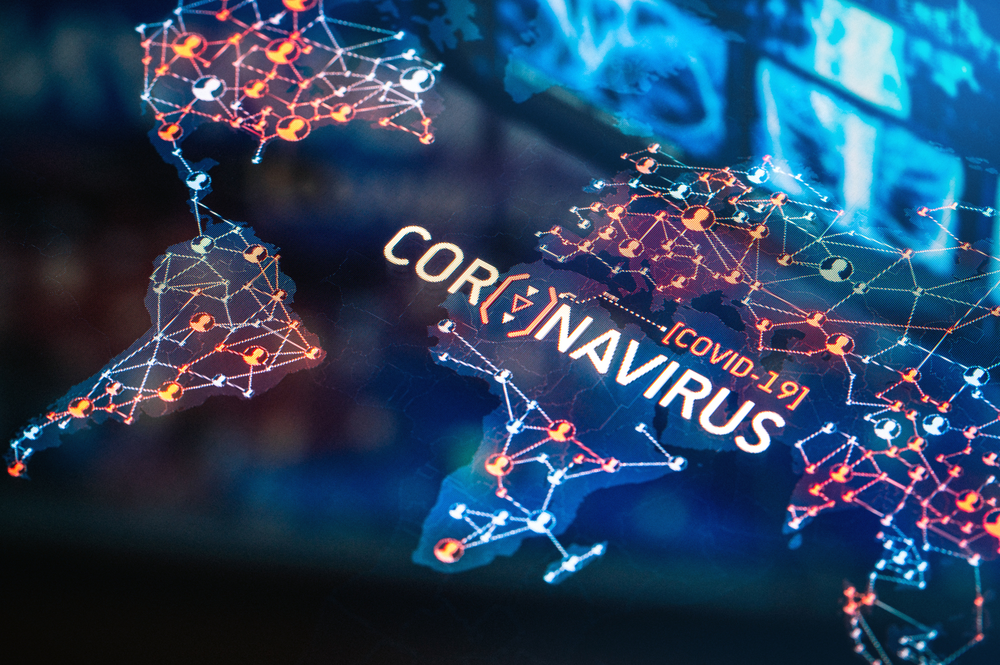

# Downloading the Dataset

Importing jovian python liabrary so that we will be able to commit the data of this notebook to jovian website

In [ ]:
!pip install jovian opendatasets --upgrade --quiet

In [ ]:
dataset_url='https://www.kaggle.com/imdevskp/corona-virus-report?select=country_wise_latest.csv'

opendatasets liabrary is used here to download dataset from kaggle

In [ ]:
import opendatasets as od
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: nehaprajapati11
Your Kaggle Key: ········


 16%|█▌        | 3.00M/19.0M [00:00<00:00, 28.2MB/s]

100%|██████████| 19.0M/19.0M [00:00<00:00, 49.5MB/s]


In [ ]:
data_dir = './corona-virus-report'

In [ ]:
import os
os.listdir(data_dir)

['country_wise_latest.csv', '.ipynb_checkpoints']

In [ ]:
project_name = "worldwide_covid19_data_analysis" 

In [ ]:
!pip install jovian --upgrade -q

In [ ]:
import jovian

In [ ]:
jovian.commit(project=project_name)

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..
[jovian] Updating notebook "neha-prajapati/worldwide-covid19-data-analysis" on https://jovian.ai
[jovian] Uploading notebook..
[jovian] Uploading additional files...
[jovian] Committed successfully! https://jovian.ai/neha-prajapati/worldwide-covid19-data-analysis


'https://jovian.ai/neha-prajapati/worldwide-covid19-data-analysis'

## Data Preparation and Cleaning

This process involves numerical computation on data if required and fixing all the missing values in the dataset


Importing necessary liabraries

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
covid_df=pd.read_csv(data_dir+'/country_wise_latest.csv')

In [ ]:
covid_df

,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase,WHO Region
0,Afghanistan,36263,1269,25198,9796,106,10,18,3.50,69.49,5.04,35526,737,2.07,Eastern Mediterranean
1,Albania,4880,144,2745,1991,117,6,63,2.95,56.25,5.25,4171,709,17.00,Europe
2,Algeria,27973,1163,18837,7973,616,8,749,4.16,67.34,6.17,23691,4282,18.07,Africa
3,Andorra,907,52,803,52,10,0,0,5.73,88.53,6.48,884,23,2.60,Europe
4,Angola,950,41,242,667,18,1,0,4.32,25.47,16.94,749,201,26.84,Africa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,West Bank and Gaza,10621,78,3752,6791,152,2,0,0.73,35.33,2.08,8916,1705,19.12,Eastern Mediterranean
183,Western Sahara,10,1,8,1,0,0,0,10.00,80.00,12.50,10,0,0.00,Africa
184,Yemen,1691,483,833,375,10,4,36,28.56,49.26,57.98,1619,72,4.45,Eastern Mediterranean
185,Zambia,4552,140,2815,1597,71,1,465,3.08,61.84,4.97,3326,1226,36.86,Africa


In [ ]:
covid_df.shape  # checking the shapeof dataframe

(187, 15)

187 rows and 15 colums

In [ ]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Country/Region          187 non-null    object 
 1   Confirmed               187 non-null    int64  
 2   Deaths                  187 non-null    int64  
 3   Recovered               187 non-null    int64  
 4   Active                  187 non-null    int64  
 5   New cases               187 non-null    int64  
 6   New deaths              187 non-null    int64  
 7   New recovered           187 non-null    int64  
 8   Deaths / 100 Cases      187 non-null    float64
 9   Recovered / 100 Cases   187 non-null    float64
 10  Deaths / 100 Recovered  187 non-null    float64
 11  Confirmed last week     187 non-null    int64  
 12  1 week change           187 non-null    int64  
 13  1 week % increase       187 non-null    float64
 14  WHO Region              187 non-null    ob

from the above decription we can see their are no null values in tha dataset

In [ ]:
covid_df.describe()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
count,1.870000e+02,187.000000,1.870000e+02,1.870000e+02,187.000000,187.000000,187.000000,187.000000,187.000000,187.00,1.870000e+02,187.000000,187.000000
mean,8.813094e+04,3497.518717,5.063148e+04,3.400194e+04,1222.957219,28.957219,933.812834,3.019519,64.820535,inf,7.868248e+04,9448.459893,13.606203
std,3.833187e+05,14100.002482,1.901882e+05,2.133262e+05,5710.374790,120.037173,4197.719635,3.454302,26.287694,NaN,3.382737e+05,47491.127684,24.509838
min,1.000000e+01,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,1.000000e+01,-47.000000,-3.840000
25%,1.114000e+03,18.500000,6.265000e+02,1.415000e+02,4.000000,0.000000,0.000000,0.945000,48.770000,1.45,1.051500e+03,49.000000,2.775000
50%,5.059000e+03,108.000000,2.815000e+03,1.600000e+03,49.000000,1.000000,22.000000,2.150000,71.320000,3.62,5.020000e+03,432.000000,6.890000
75%,4.046050e+04,734.000000,2.260600e+04,9.149000e+03,419.500000,6.000000,221.000000,3.875000,86.885000,6.44,3.708050e+04,3172.000000,16.855000
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,56336.000000,1076.000000,33728.000000,28.560000,100.000000,inf,3.834677e+06,455582.000000,226.320000


# Exploratory Analysis and Visualization

Let's begin by importing`matplotlib.pyplot` and `seaborn`and extracting some important information from the data

- Matplolib-for data visualization
- seaborn- for plotting beautiful graphs


In [ ]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (12, 7)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Asking and Answering Questions

## Q1 Top 10 countries with highest no. of cases?

/opt/conda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


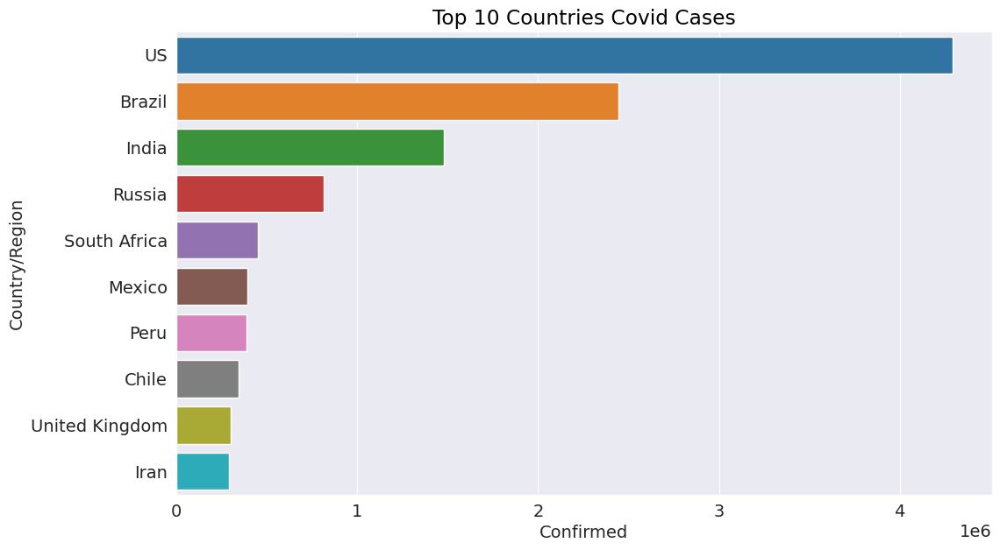

In [ ]:
df=covid_df.sort_values('Confirmed',ascending=False).head(10)
plt.figure(dpi=100)
plt.title('Top 10 Countries Covid Cases',color='black')
sns.barplot('Confirmed','Country/Region',data=df)
plt.show()



### Q2. % of Total recoverd,active amd Deaths due to covid19?

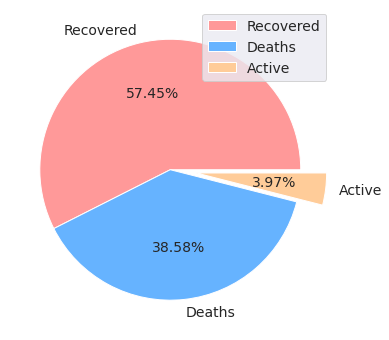

In [ ]:
labels=['Recovered','Deaths','Active']
total_deaths=covid_df['Deaths'].sum()
total_recovered=covid_df['Recovered'].sum()
total_active=covid_df['Active'].sum()
colors=['#ff9999','#66b3ff','#ffcc99','#99ff99']
sizes=[total_recovered,total_active,total_deaths]/(covid_df['Confirmed'].sum())*360
plt.figure(figsize=(6,6))
plt.pie(sizes,colors=colors,labels=labels,autopct='%1.2f%%',explode=[0,0,0.2])
plt.legend(['Recovered','Deaths','Active'])
plt.show()


### Q3.Distribution of death per 100 cases across every country?

/opt/conda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


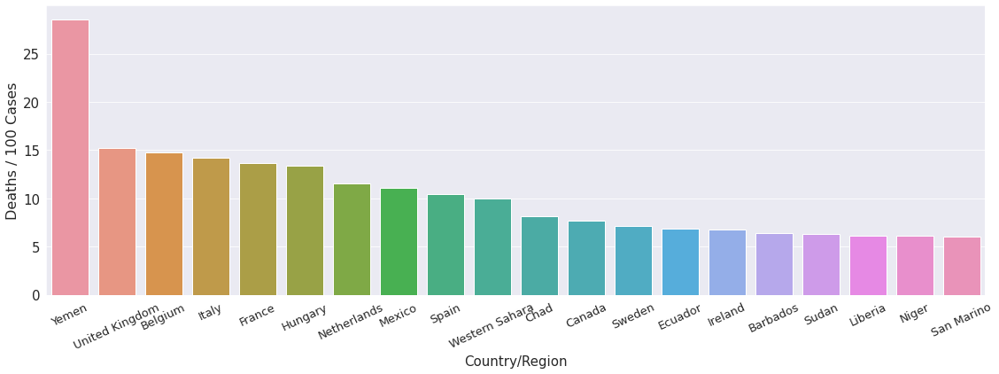

In [ ]:
df1=covid_df.sort_values('Deaths / 100 Cases',ascending=False)
plt.figure(figsize=(19,6))
sns.barplot(df1['Country/Region'].head(20),df1['Deaths / 100 Cases'].head(20),label="Death per 100 cases")
plt.xticks(fontsize=13,rotation=25)
plt.yticks(fontsize=15)
plt.xlabel("Country/Region",fontsize=15)
plt.ylabel('Deaths / 100 Cases',fontsize=16)
plt.title('')
plt.show()

## Q4: Top 10 countries one week change?

<Figure size 600x350 with 0 Axes>

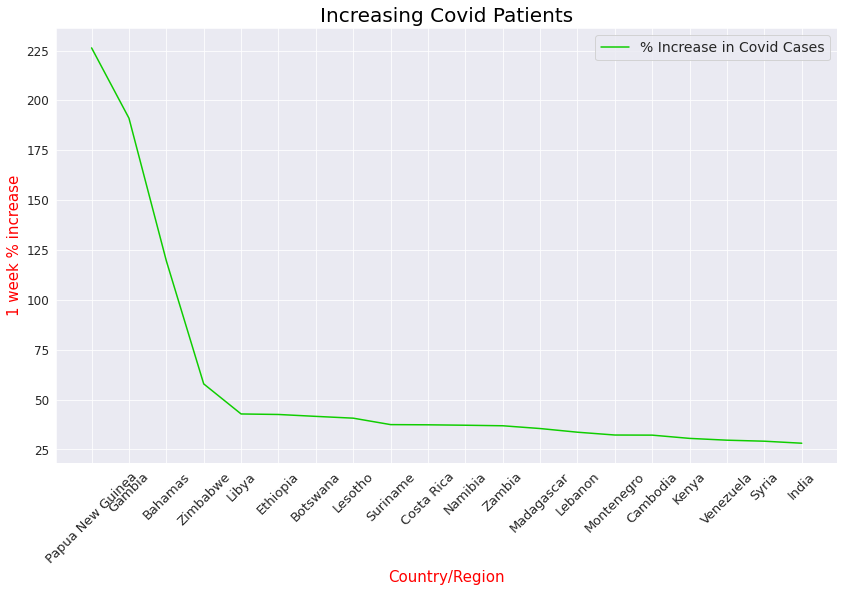

In [ ]:
plt.figure(dpi=50)
plt.figure(figsize=(14,8))
df=covid_df.sort_values('1 week % increase',ascending=False).head(20)
plt.xlabel('Country/Region',size=15,color="red",)
plt.xticks(rotation=45,fontsize=13)
plt.yticks(fontsize=12)
plt.ylabel('1 week % increase',size=15,color='red')
sns.lineplot(x='Country/Region',y='1 week % increase',data=df,label="% Increase in Covid Cases",color='#0fcd00')
plt.title("Increasing Covid Patients",color="black",fontsize=20)

plt.show()



## Q5. Comparision between new cases and new recovered of different countries?

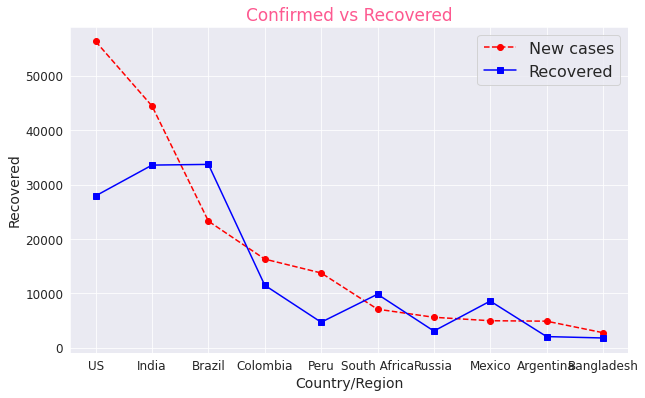

In [ ]:
comparison=covid_df.sort_values(['New cases','Recovered'],ascending=False).head(10)
plt.figure(figsize=(10,6))
plt.plot(comparison['Country/Region'],comparison['New cases'],'o--r')
plt.plot(comparison['Country/Region'],comparison['New recovered'],'s-b')
plt.xlabel('Country/Region',fontsize=14)
plt.ylabel('Recovered',fontsize=14)
plt.legend(['New cases','Recovered'],fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Confirmed vs Recovered",fontsize=17,color='#fd5990')
plt.show()

### Q6: Distribution of new cases , recovered,deaths of different who region?

In [ ]:
df2=covid_df.groupby(by=['WHO Region']).sum()
df2.head()

,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,Deaths / 100 Cases,Recovered / 100 Cases,Deaths / 100 Recovered,Confirmed last week,1 week change,1 week % increase
WHO Region,,,,,,,,,,,,,
Africa,723207,12223,440645,270339,12176,353,14563,110.71,2736.71,inf,608120,115087,868.15
Americas,8839286,342732,4468616,4027938,129531,3555,94776,106.84,2180.20,inf,7815198,1024088,571.59
Eastern Mediterranean,1490744,38339,1201400,251005,12410,445,14843,78.39,1465.05,inf,1398847,91897,230.61
Europe,3299523,211144,1993723,1094656,22294,304,11732,235.11,3843.56,inf,3146816,152707,435.10
South-East Asia,1835297,41349,1156933,637015,48993,734,37582,12.96,667.04,19.56,1478283,357014,85.13


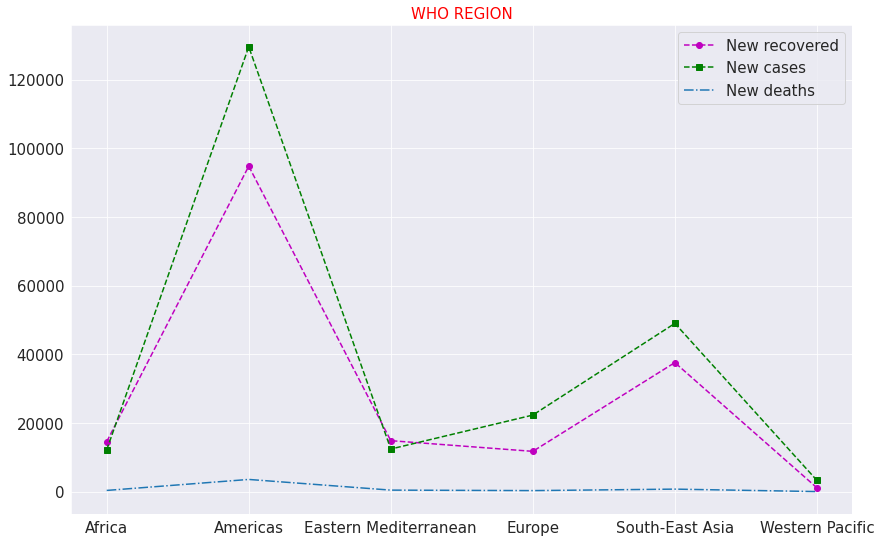

In [ ]:
plt.figure(figsize=(14,9))
plt.plot(df2['New recovered'],'o--m')
plt.plot(df2['New cases'],'s--g')
plt.plot(df2['New deaths'],'-.')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title("WHO REGION",fontsize=15,color='red')
plt.legend(['New recovered','New cases','New deaths'],fontsize=15)
plt.show()

# Inferences and Conclusion


- From the above information we can conclude that United Nations has the highest no. of covid cases.

- 57.45% of people got recoverd from Covid-19.

- Among all the WHO regions the country with highest no.of cases is `America` and second highest is `South-East Asia`		



## References and Future Work

links to all the learning resources

References:
- [geeksforgeeks](https://www.geeksforgeeks.org)
- [Kaggle dataset](https://www.kaggle.com/)
- [Matplotlib documentation](https://matplotlib.org)
- [Stack Overflow](https://insights.stackoverflow.com)
- [Seaborn documentation](https://seaborn.pydata.org/tutorial.html)

In [ ]:
import jovian

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..
[jovian] Updating notebook "neha-prajapati/worldwide-covid19-data-analysis" on https://jovian.ai
[jovian] Uploading notebook..
[jovian] Uploading additional files...
[jovian] Committed successfully! https://jovian.ai/neha-prajapati/worldwide-covid19-data-analysis


'https://jovian.ai/neha-prajapati/worldwide-covid19-data-analysis'